# Environment

In [ ]:
# %pip install optionlib

  Attempting uninstall: optionlib
    Found existing installation: optionlib 0.0.1
    Uninstalling optionlib-0.0.1:
      Successfully uninstalled optionlib-0.0.1
Note: you may need to restart the kernel to use updated packages.


In [1]:
from optionlib.data import ticker, prices, earnings
from optionlib import *

In [2]:
from plotly import express as px
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn.ensemble import GradientBoostingRegressor
from joblib import Parallel, delayed
from scipy.stats import norm
from IPython.display import clear_output

# Data

## Ticker

In [379]:
data = ticker.base_data(risk_ticker='SPY')

In [380]:
data.tail()

,Open,High,Low,Close,Adj Close,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,...,pct_delta_60d,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,VIX,jobs_friday,month
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-22,473.859985,475.380005,471.700012,473.649994,473.649994,67126600,9.188536e+07,0.002010,0.011511,-0.002506,...,0.105316,0.077359,0.157531,0.199813,0.429428,30.97,-0.41,13.03,0,12
2023-12-26,474.070007,476.579987,473.989990,475.649994,475.649994,55387000,8.279407e+07,0.004223,0.006241,0.015782,...,0.112684,0.090215,0.161227,0.192733,0.373286,30.97,-0.37,12.99,0,12
2023-12-27,475.440002,476.660004,474.890015,476.510010,476.510010,68000300,7.231993e+07,0.001808,0.006038,0.008060,...,0.115139,0.091661,0.163014,0.206080,0.369114,30.97,-0.41,12.43,0,12
2023-12-28,476.880005,477.549988,476.260010,476.690002,476.690002,77158100,7.328890e+07,0.000378,0.002186,0.006418,...,0.130696,0.085014,0.168215,0.205071,0.270165,30.97,-0.42,12.47,0,12
2023-12-29,476.489990,477.029999,473.299988,475.309998,475.309998,122234100,8.278494e+07,-0.002895,-0.002518,-0.000715,...,0.119272,0.084811,0.149563,0.215969,0.278237,32.27,-0.35,12.45,0,12


## Earnings

In [5]:
stock = 'TSLA'
earnings = earnings.earnings_data(stock)

In [6]:
earnings.head()

,earnings_release
Date,
2010-11-09,1
2011-02-15,1
2011-05-04,1
2011-08-03,1
2011-11-02,1


## Option prices

In [381]:
prices_df = prices.option_prices('SPY','2024-01-05')

In [382]:
prices_df.head()

Contract Name         Last Trade Date  Last Price  \
put_call Strike                                                           
C        270.0   SPY240105C00270000  2023-12-29 12:24PM EST      204.00   
         275.0   SPY240105C00275000  2023-11-24 10:04AM EST      181.21   
         280.0   SPY240105C00280000  2023-11-24 10:03AM EST      176.23   
         285.0   SPY240105C00285000  2023-12-28 12:41PM EST      192.40   
         290.0   SPY240105C00290000  2023-11-24 10:02AM EST      166.24   

                    Bid     Ask  Change % Change Volume  Open Interest  \
put_call Strike                                                          
C        270.0   204.70  205.82   -3.37   -1.63%      1             46   
         275.0   198.55  199.15    0.00        -      1              0   
         280.0   193.56  194.16    0.00        -      1              0   
         285.0   189.72  190.84    0.00        -     20             20   
         290.0   183.59  184.18    0.00        -      1              0   

                Implied Volatility  
put_call Strike                     
C        270.0             204.20%  
         275.0               0.00%  
         280.0               0.00%  
         285.0             187.60%  
         290.0               0.00%

# Modeling

## SPY

In [383]:
model_obj = model.Model(
    data.fillna(method = 'pad'),
    horizon = 4
)

model_obj.fit_quantiles()
model_obj.adj_factor

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done  90 out of  99 | elapsed:   42.1s remaining:    4.2s
[Parallel(n_jobs=-1)]: Done  99 out of  99 | elapsed:   45.5s finished


0.6276834542069377

,max,min
adj_factor_decile,,
1,0.671780,0.399561
2,0.828003,0.671803
3,1.008181,0.828101
4,1.213051,1.008193
5,8.425501,1.213142


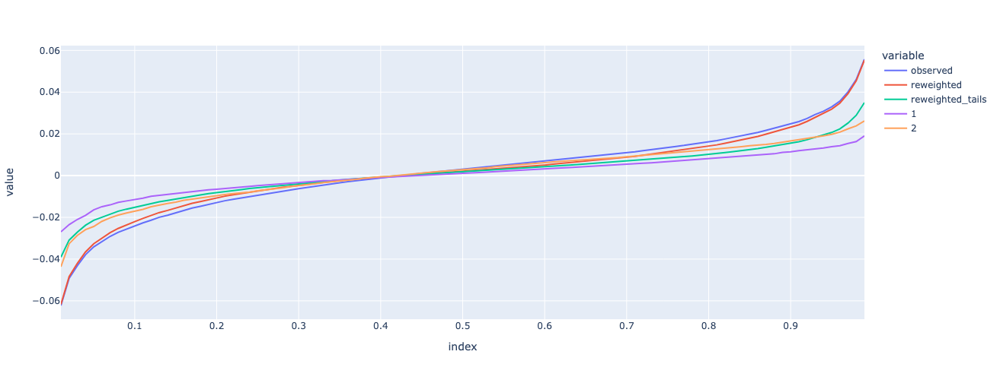

In [392]:
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor.csv')
adj_factor_hist.columns = ['Date','quantile_backtest']
adj_factor_hist = adj_factor_hist.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

adj_factor_hist = adj_factor_hist.join(model_obj.y)
adj_factor_hist = adj_factor_hist.assign(
    adj_factor_decile = lambda x: x.quantile_backtest
        .rank(pct = True).multiply(5).apply(np.floor).add(1).astype(int).replace({6:5})
)

adj_factor_bounds = adj_factor_hist.groupby('adj_factor_decile').quantile_backtest.agg(['max','min'])
display(adj_factor_bounds)

adj_factor_quintiles = adj_factor_hist.groupby(
    'adj_factor_decile'
).pct_delta_ahead.apply(
    lambda x: x.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])
).unstack(0)

px.line(model_obj.quantiles.join(adj_factor_quintiles[[1,2]]),height = 500)

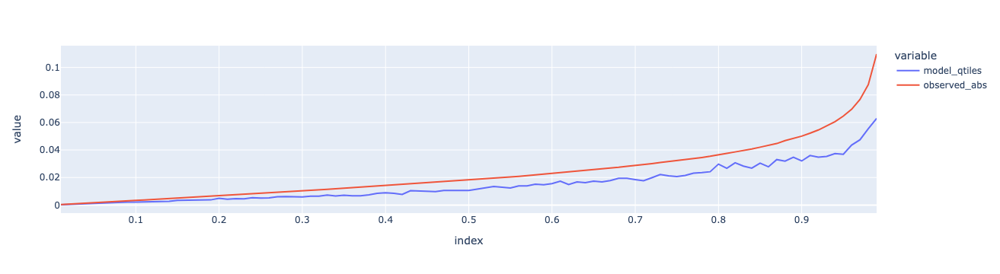

In [684]:
px.line(model_obj.model_qtiles)

### Fit historical

#### Quantile historical runs

In [274]:
%%time
model.fit_historical_quantiles(20,data.fillna(method = 'pad'),path = '../horizon_20_adj_factor.csv')

100%|██████████| 7392/7392 [41:08:53<00:00, 20.04s/it]


CPU times: user 53min 56s, sys: 6min 56s, total: 1h 52s
Wall time: 1d 17h 8min 53s


In [188]:
output = pd.Series(output,name = f'adj_factor_{horizon}')

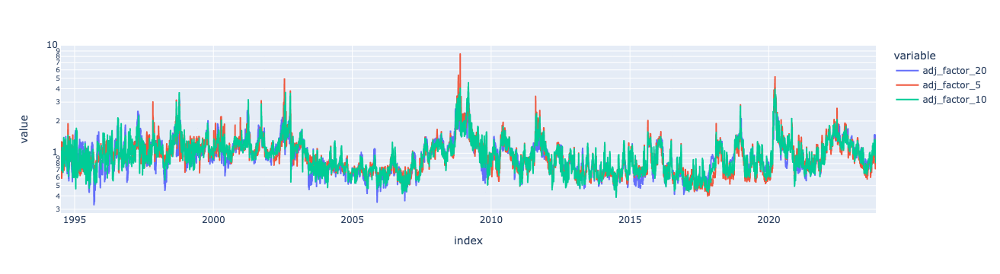

In [288]:
output_5 = pd.read_csv('../horizon_5_adj_factor.csv',index_col=0,parse_dates=True)
output_10 = pd.read_csv('../horizon_10_adj_factor.csv',index_col=0,parse_dates=True)
px.line(output.to_frame().join(output_5).join(output_10),log_y = True)

### Comparison to VIX

In [397]:
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor.csv',index_col = 0, parse_dates = True)
adj_factor_hist = adj_factor_hist.join(
    model_obj.y.abs().rename(columns = {'pct_delta_ahead':'pct_delta_ahead_abs'})
).join(
    model_obj.X.VIX
).join(model_obj.y)

In [295]:
adj_factor_hist.loc['2023-01-01':].corr()

,adj_factor_5,pct_delta_ahead_abs,VIX,pct_delta_ahead
adj_factor_5,1.000000,0.404624,0.928022,0.213894
pct_delta_ahead_abs,0.404624,1.000000,0.214502,0.207109
VIX,0.928022,0.214502,1.000000,0.171987
pct_delta_ahead,0.213894,0.207109,0.171987,1.000000


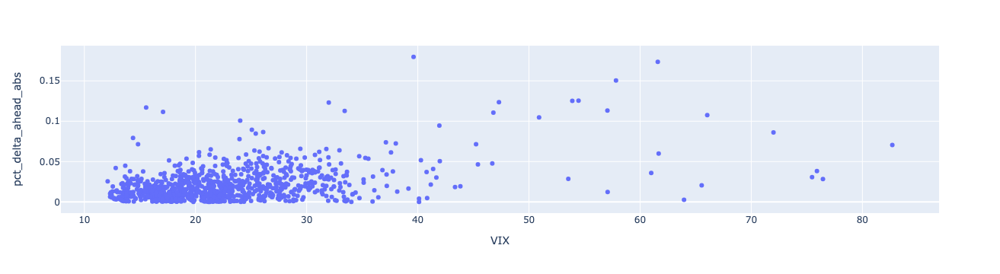

In [291]:
px.scatter(adj_factor_hist.loc['2020-01-01':],x = 'VIX',y = 'pct_delta_ahead_abs')

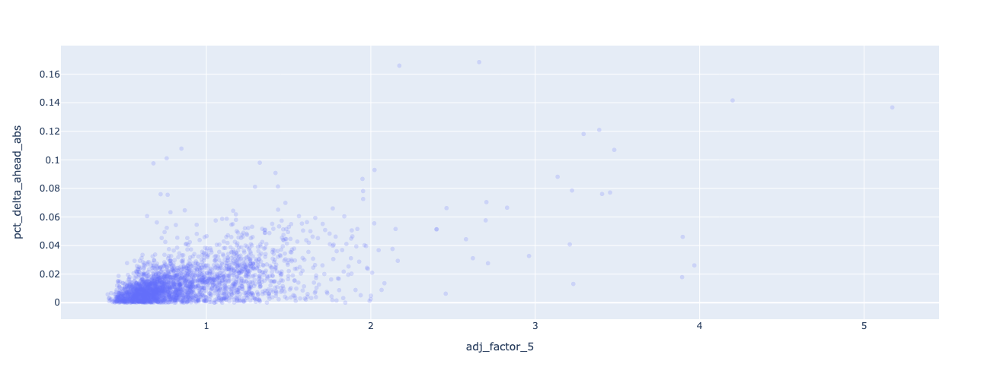

In [391]:
dt = '2013-01-01'

px.scatter(
    adj_factor_hist.loc[dt:],
    x = 'adj_factor_5',
    y = 'pct_delta_ahead_abs',
    hover_name=adj_factor_hist.loc[dt:].index,
    opacity = 0.2,
    height = 500
)

divide by zero encountered in log


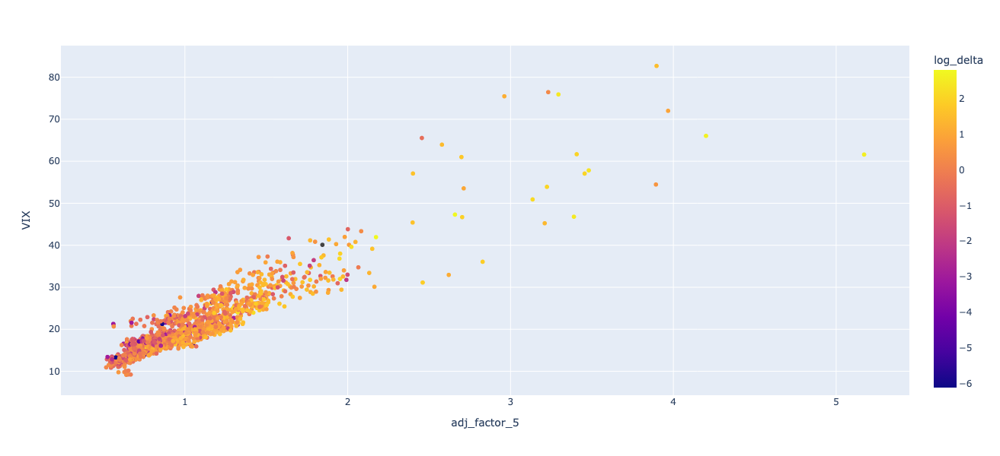

In [401]:
filter_dt = '2018-01-01'

px.scatter(
    adj_factor_hist.loc[filter_dt:].assign(log_delta = lambda x: np.log(x.pct_delta_ahead_abs*100)),
    x = 'adj_factor_5',
    y = 'VIX',
    color='log_delta',
    hover_name=adj_factor_hist.loc[filter_dt:].index,
#    opacity = 0.5
    height=600
)

### Historical adjustment factor quintiles

In [412]:
n_years = 10
adj_factor_hist = pd.read_csv('../horizon_5_adj_factor.csv')
adj_factor_hist.columns = ['Date','quantile_backtest']
adj_factor_hist = adj_factor_hist.assign(Date = lambda x: pd.to_datetime(x.Date)).set_index('Date')

adj_factor_hist = adj_factor_hist.join(model_obj.y).iloc[-252*n_years:]
adj_factor_hist = adj_factor_hist.assign(
    adj_factor_decile = lambda x: x.quantile_backtest
        .rank(pct = True).multiply(5).apply(np.floor).add(1).astype(int).replace({6:5})
)

In [413]:
caliper = round(adj_factor_hist.shape[0]/10)

qtile_df_low = adj_factor_hist.sort_values('quantile_backtest').where(
    lambda x: x.quantile_backtest.lt(model_obj.adj_factor)
).dropna().tail(caliper)

qtile_df_hi = adj_factor_hist.sort_values('quantile_backtest').where(
    lambda x: x.quantile_backtest.gt(model_obj.adj_factor)
).dropna().head(caliper)

floating_quintile = pd.concat(
    [qtile_df_low,qtile_df_hi]
).pct_delta_ahead.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])

In [486]:
caliper = round(adj_factor_hist.shape[0]/10)

qtile_df_low = adj_factor_hist.sort_values('quantile_backtest').where(
    lambda x: x.quantile_backtest.lt(1)
).dropna().tail(caliper)

qtile_df_hi = adj_factor_hist.sort_values('quantile_backtest').where(
    lambda x: x.quantile_backtest.gt(1)
).dropna().head(caliper)

floating_quintile = pd.concat(
    [qtile_df_low,qtile_df_hi]
).pct_delta_ahead.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])

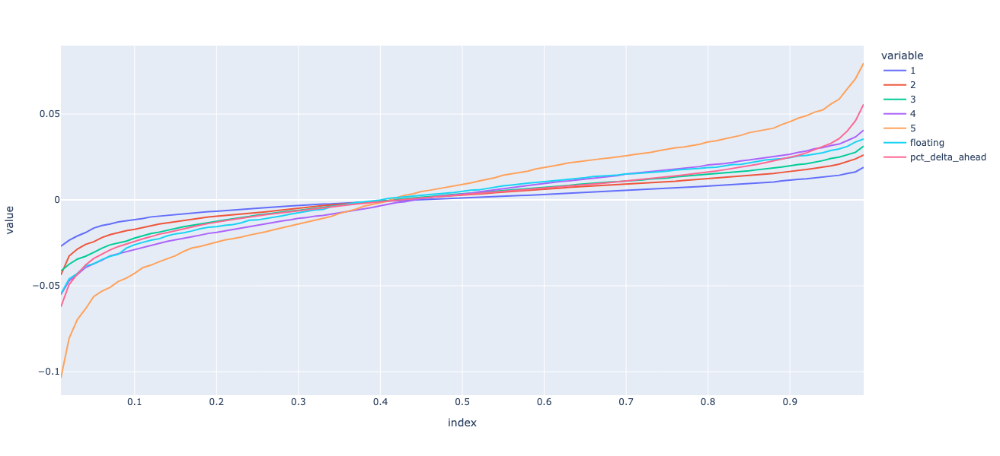

In [487]:
px.line(
    adj_factor_quintiles.join(
        floating_quintile.rename('floating')
    ).join(
        model_obj.y.quantile([round(i,2) for i in np.linspace(0.01,.99,99)])
    ), height = 600
)

### Low/high times within quintiles

In [498]:
temp = output_10.join(model_obj.y).assign(
    af_low_quintile = lambda x: x.adj_factor_10.where(x.adj_factor_10.lt(x.adj_factor_10.quantile(.2))),
    delta_low_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).lt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.1))
    ),
    delta_hi_quintile = lambda x: x.pct_delta_ahead.where(
        x.pct_delta_ahead.where(~x.af_low_quintile.isna()).gt(x.pct_delta_ahead.where(~x.af_low_quintile.isna()).quantile(.9))
    ),
)

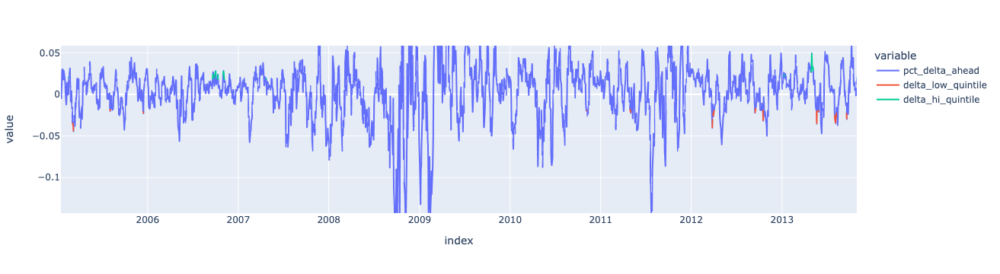

In [502]:
px.line(
    temp.filter(regex = 'delta')
)

In [500]:
temp

,adj_factor_10,pct_delta_ahead,af_low_quintile,delta_low_quintile,delta_hi_quintile
1994-07-05,0.989536,0.012905,NaN,NaN,NaN
1994-07-06,0.909043,0.009780,NaN,NaN,NaN
1994-07-07,0.829236,0.007652,NaN,NaN,NaN
1994-07-08,0.886934,0.009743,NaN,NaN,NaN
1994-07-11,1.049821,0.014665,NaN,NaN,NaN
...,...,...,...,...,...
2023-11-16,0.747421,0.019701,NaN,NaN,NaN
2023-11-17,0.682659,0.013088,NaN,NaN,NaN
2023-11-20,0.646113,0.005151,0.646113,NaN,NaN
2023-11-21,0.714054,0.003287,NaN,NaN,NaN


### Price target

In [124]:
mod = GradientBoostingRegressor(loss = 'huber')#(loss = 'quantile',alpha = 50/100)

In [141]:
mod.fit(
    model_obj.X,
    model_obj.data.pct_delta_ahead[model_obj.X.index]*100
)

GradientBoostingRegressor(loss='huber')

In [134]:
import shap

In [142]:
explainer = shap.Explainer(mod.predict, model_obj.X.sample(100))
shap_values = explainer(model_obj.X)
shap_values_sample = explainer(model_obj.data.loc['2023-12-15',model_obj.X.columns])

PermutationExplainer explainer: 7408it [04:22, 27.16it/s]                          


In [159]:
model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0)

,Volume,Volume_7d,pct_delta_1d,pct_delta_2d,pct_delta_3d,pct_delta_4d,pct_delta_5d,pct_delta_6d,pct_delta_7d,pct_delta_30d,pct_delta_60d,pct_delta_90d,pct_delta_180d,pct_delta_360d,hv30,shiller_pe,T10Y2Y,VIX,jobs_friday
Date,,,,,,,,,,,,,,,,,,,
2023-12-11,65002200,7.364650e+07,0.003890,0.008205,0.015898,0.011805,0.011605,0.006295,0.012248,0.124939,0.041997,0.029298,0.167378,0.187665,0.431437,30.97,-0.48,12.63,0.0
2023-12-12,68327600,7.067931e+07,0.004567,0.008475,0.012810,0.020538,0.016426,0.016225,0.010891,0.116726,0.046142,0.038697,0.170521,0.194072,0.408854,30.97,-0.53,12.07,0.0
2023-12-13,93278000,7.365747e+07,0.013790,0.018420,0.022382,0.026777,0.034612,0.030442,0.030239,0.125060,0.062772,0.043909,0.189333,0.224527,0.440984,30.97,-0.42,12.19,0.0
2023-12-14,119026000,8.069069e+07,0.003209,0.017044,0.021689,0.025663,0.030072,0.037932,0.033749,0.116761,0.076076,0.051833,0.176056,0.239424,0.425021,30.97,-0.45,12.48,0.0
2023-12-15,141319300,9.100420e+07,-0.005678,-0.002487,0.011269,0.015888,0.019839,0.024224,0.032039,0.089539,0.087948,0.052900,0.162571,0.238893,0.365930,31.92,-0.53,12.28,0.0


In [160]:
shap_values_sample = explainer(model_obj.data.loc['2023-12-11':'2023-12-15',model_obj.X.columns].fillna(0))

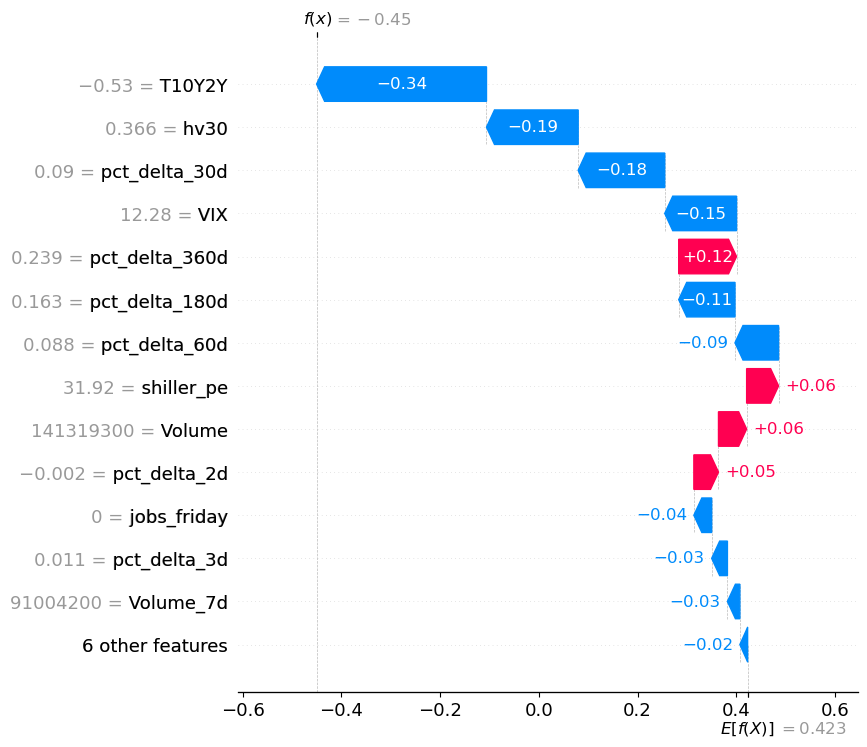

In [163]:
shap.plots.waterfall(shap_values_sample[-1], max_display=14)

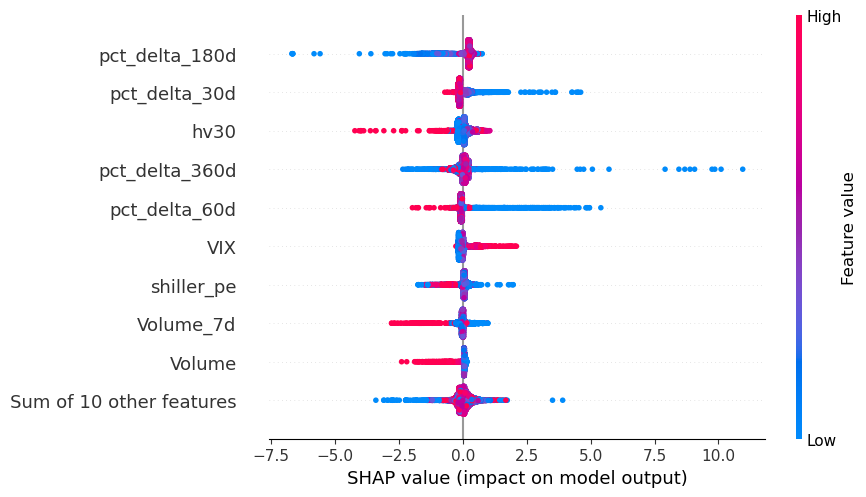

In [166]:
shap.plots.beeswarm(shap_values)

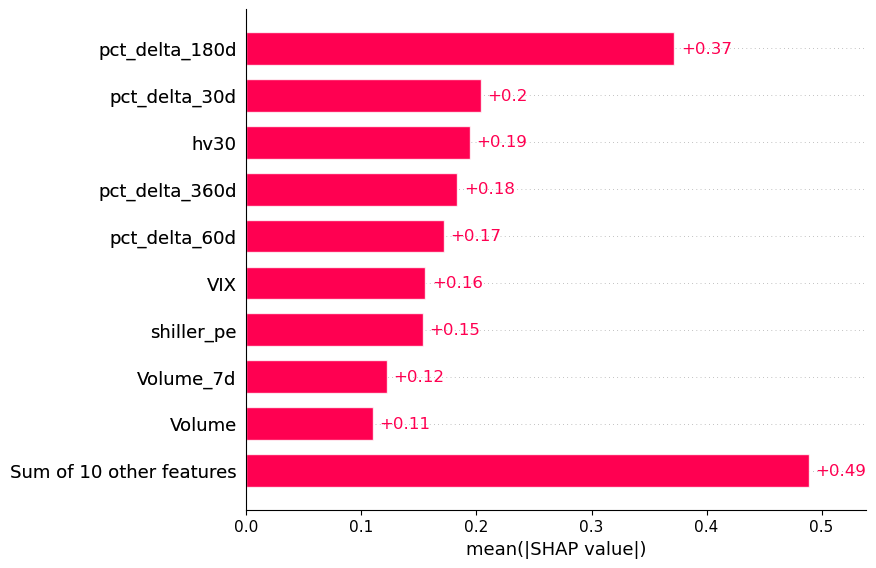

In [167]:
shap.plots.bar(shap_values)

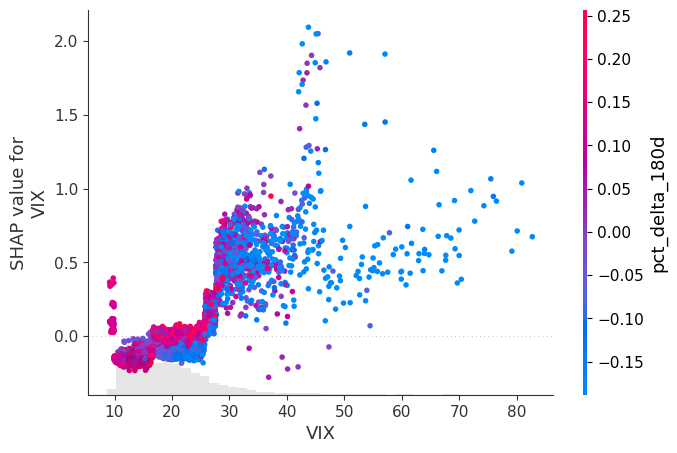

In [168]:
shap.plots.scatter(shap_values[:, "VIX"], color=shap_values)


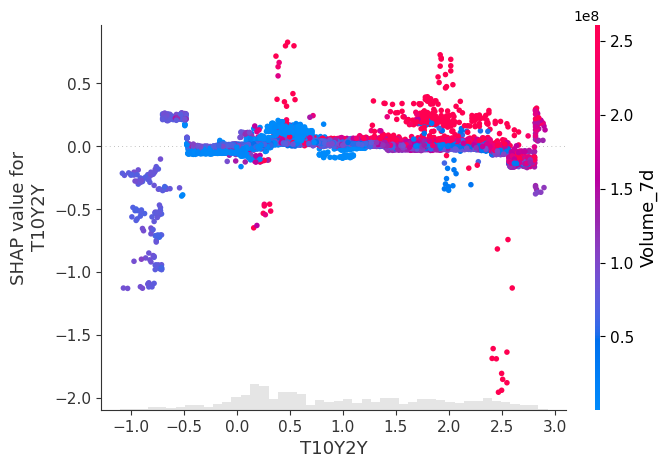

In [169]:
shap.plots.scatter(shap_values[:, "T10Y2Y"], color=shap_values)


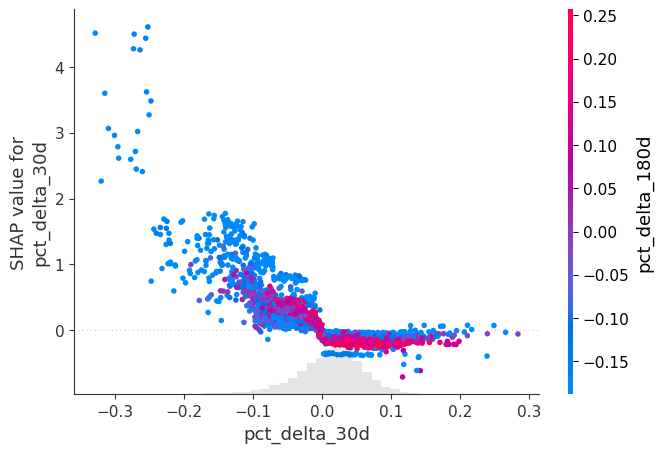

In [170]:
shap.plots.scatter(shap_values[:, "pct_delta_30d"], color=shap_values)


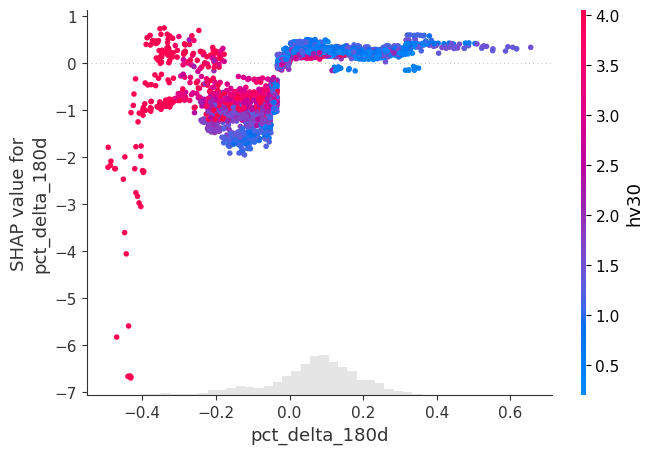

In [171]:
shap.plots.scatter(shap_values[:, "pct_delta_180d"], color=shap_values)


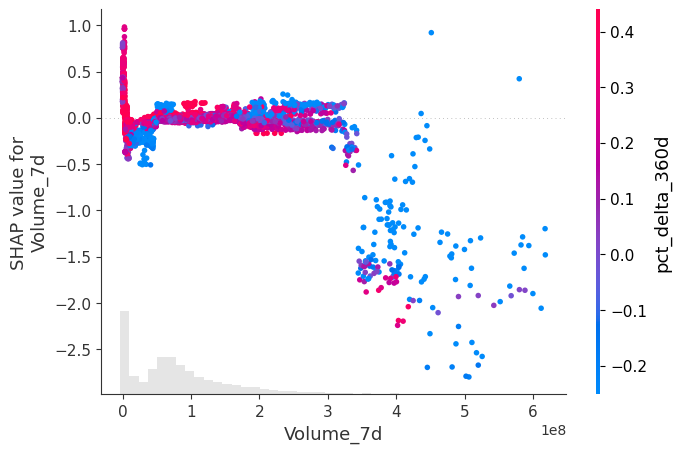

In [174]:
shap.plots.scatter(shap_values[:, "Volume_7d"], color=shap_values)


# Trade menu

In [416]:
bounds = tuple(round(i) for i in floating_quintile.agg(['min','max']).add(1).multiply(data.Close[-1]))
print(bounds)

menu = menus.TradeMenu(
    prices_df,
    data.Close[-1],
    floating_quintile,
    bounds = bounds
)

(461, 485)
Write strategies complete
Spreads and straddles complete
Calculating 17539 Iron Condors...
Iron condors complete


In [417]:
menu.menu.sort_values('EV',ascending =False)\
    .loc[
    menu.menu.EV.gt(0)
    #& menu.menu.win_pct.gt(.7)
].head(50)# menu.menu.cost.lt(0) &

cost  \
strategy    leg_1 leg_2 leg_3 leg_4         
Iron condor 461.0 476.0 476.0 485.0 -4.64   
            462.0 476.0 476.0 485.0 -4.62   
            461.0 476.0 477.0 485.0 -4.18   
            462.5 476.0 476.0 485.0 -4.61   
            463.0 476.0 476.0 485.0 -4.60   
            464.0 476.0 476.0 485.0 -4.57   
            462.0 476.0 477.0 485.0 -4.16   
            465.0 476.0 476.0 485.0 -4.53   
            461.0 477.0 477.0 485.0 -4.72   
            466.0 476.0 476.0 485.0 -4.48   
            462.5 476.0 477.0 485.0 -4.15   
            463.0 476.0 477.0 485.0 -4.14   
            464.0 476.0 477.0 485.0 -4.11   
            462.0 477.0 477.0 485.0 -4.70   
            465.0 476.0 477.0 485.0 -4.07   
            467.0 476.0 476.0 485.0 -4.41   
            466.0 476.0 477.0 485.0 -4.02   
            461.0 476.0 478.0 485.0 -3.79   
                  475.0 476.0 485.0 -4.15   
            462.5 477.0 477.0 485.0 -4.69   
            463.0 477.0 477.0 485.0 -4.68   
            461.0 476.0 476.0 484.0 -4.58   
            464.0 477.0 477.0 485.0 -4.65   
            465.0 477.0 477.0 485.0 -4.61   
            462.0 476.0 478.0 485.0 -3.77   
            467.0 476.0 477.0 485.0 -3.95   
            466.0 477.0 477.0 485.0 -4.56   
            462.0 475.0 476.0 485.0 -4.13   
            461.0 477.0 478.0 485.0 -4.33   
                  475.0 477.0 485.0 -3.69   
            462.5 476.0 478.0 485.0 -3.76   
            468.0 476.0 476.0 485.0 -4.32   
            462.0 476.0 476.0 484.0 -4.56   
            462.5 475.0 476.0 485.0 -4.12   
            461.0 476.0 477.0 484.0 -4.12   
            463.0 476.0 478.0 485.0 -3.75   
                  475.0 476.0 485.0 -4.11   
            462.5 476.0 476.0 484.0 -4.55   
            463.0 476.0 476.0 484.0 -4.54   
            461.0 478.0 478.0 485.0 -4.96   
            464.0 476.0 478.0 485.0 -3.72   
                  475.0 476.0 485.0 -4.08   
            462.0 477.0 478.0 485.0 -4.31   
            467.0 477.0 477.0 485.0 -4.49   
            465.0 476.0 478.0 485.0 -3.68   
            462.0 475.0 477.0 485.0 -3.67   
            465.0 475.0 476.0 485.0 -4.04   
            466.0 476.0 478.0 485.0 -3.63   
                  475.0 476.0 485.0 -3.99   
            464.0 476.0 476.0 484.0 -4.51   

                                                                             quantiles  \
strategy    leg_1 leg_2 leg_3 leg_4                                                      
Iron condor 461.0 476.0 476.0 485.0  0.01   -0.099745
0.02   -0.085837
0.03   -0.07...   
            462.0 476.0 476.0 485.0  0.01   -0.093800
0.02   -0.086037
0.03   -0.07...   
            461.0 476.0 477.0 485.0  0.01   -0.104345
0.02   -0.090437
0.03   -0.08...   
            462.5 476.0 476.0 485.0  0.01   -0.088900
0.02   -0.086137
0.03   -0.07...   
            463.0 476.0 476.0 485.0  0.01   -0.084000
0.02   -0.084000
0.03   -0.07...   
            464.0 476.0 476.0 485.0  0.01   -0.074300
0.02   -0.074300
0.03   -0.07...   
            462.0 476.0 477.0 485.0  0.01   -0.098400
0.02   -0.090637
0.03   -0.08...   
            465.0 476.0 476.0 485.0  0.01   -0.064700
0.02   -0.064700
0.03   -0.06...   
            461.0 477.0 477.0 485.0  0.01   -0.108945
0.02   -0.095037
0.03   -0.08...   
            466.0 476.0 476.0 485.0  0.01   -0.055200
0.02   -0.055200
0.03   -0.05...   
            462.5 476.0 477.0 485.0  0.01   -0.093500
0.02   -0.090737
0.03   -0.08...   
            463.0 476.0 477.0 485.0  0.01   -0.088600
0.02   -0.088600
0.03   -0.08...   
            464.0 476.0 477.0 485.0  0.01   -0.078900
0.02   -0.078900
0.03   -0.07...   
            462.0 477.0 477.0 485.0  0.01   -0.103000
0.02   -0.095237
0.03   -0.08...   
            465.0 476.0 477.0 485.0  0.01   -0.069300
0.02   -0.069300
0.03   -0.06...   
            467.0 476.0 476.0 485.0  0.01   -0.045900
0.02   -0.045900
0.03   -0.04...   
            466.0 476.0 477.0 485.0  0.01   -0.059800
0.02   -0.059800
0.03 

In [418]:
menu.menu.sort_values('win_pct',ascending =False)\
    .loc[
    menu.menu.EV.gt(0)
    #& menu.menu.win_pct.gt(.7)
].head(50)# menu.menu.cost.lt(0) &

cost  \
strategy         leg_1 leg_2 leg_3 leg_4         
cash covered put 461.0 NaN   NaN   NaN   -0.10   
covered call     485.0 NaN   NaN   NaN   -0.10   
Bull put spread  461.0 462.0 NaN   NaN   -0.01   
Bear call spread 485.0 484.0 NaN   NaN   -0.05   
Bull put spread  461.0 462.5 NaN   NaN   -0.02   
cash covered put 462.5 NaN   NaN   NaN   -0.13   
                 462.0 NaN   NaN   NaN   -0.12   
covered call     484.0 NaN   NaN   NaN   -0.16   
cash covered put 463.0 NaN   NaN   NaN   -0.14   
Bear call spread 484.0 483.0 NaN   NaN   -0.08   
Iron condor      461.0 462.5 484.0 485.0 -0.07   
covered call     483.0 NaN   NaN   NaN   -0.25   
Iron condor      462.0 462.5 484.0 485.0 -0.05   
Bear call spread 485.0 483.0 NaN   NaN   -0.14   
Bull put spread  461.0 463.0 NaN   NaN   -0.03   
Iron condor      481.0 482.0 482.0 485.0 -1.04   
                 461.0 462.0 484.0 485.0 -0.06   
                       463.0 484.0 485.0 -0.08   
                 462.0 463.0 484.0 485.0 -0.06   
                 461.0 462.5 483.0 484.0 -0.10   
                                   485.0 -0.16   
Bull put spread  462.0 464.0 NaN   NaN   -0.04   
cash covered put 464.0 NaN   NaN   NaN   -0.17   
Iron condor      461.0 462.0 483.0 484.0 -0.09   
                                   485.0 -0.15   
covered call     482.0 NaN   NaN   NaN   -0.37   
Iron condor      462.0 462.5 483.0 484.0 -0.08   
Bull put spread  461.0 464.0 NaN   NaN   -0.06   
Iron condor      462.5 463.0 484.0 485.0 -0.05   
                 462.0 462.5 483.0 485.0 -0.14   
Bull put spread  461.0 465.0 NaN   NaN   -0.10   
Iron condor      480.0 481.0 481.0 485.0 -1.15   
                 461.0 464.0 484.0 485.0 -0.11   
                 462.0 464.0 484.0 485.0 -0.09   
Bull put spread  462.5 465.0 NaN   NaN   -0.07   
Iron condor      461.0 462.5 482.0 485.0 -0.28   
cash covered put 465.0 NaN   NaN   NaN   -0.21   
Iron condor      463.0 464.0 484.0 485.0 -0.07   
                 462.0 463.0 483.0 485.0 -0.15   
                                   484.0 -0.09   
                 462.5 464.0 484.0 485.0 -0.08   
                 461.0 463.0 483.0 485.0 -0.17   
                                   484.0 -0.11   
                             482.0 485.0 -0.29   
Bear call spread 484.0 482.0 NaN   NaN   -0.20   
                 485.0 482.0 NaN   NaN   -0.26   
Iron condor      462.5 463.0 483.0 485.0 -0.14   
                                   484.0 -0.08   
Bull put spread  462.0 465.0 NaN   NaN   -0.08   
Iron condor      462.0 462.5 482.0 484.0 -0.20   

                                                                                  quantiles  \
strategy         leg_1 leg_2 leg_3 leg_4                                                      
cash covered put 461.0 NaN   NaN   NaN    0.01    0.001
0.02    0.001
0.03    0.001
0.04...   
covered call     485.0 NaN   NaN   NaN    0.01    0.001
0.02    0.001
0.03    0.001
0.04...   
Bull put spread  461.0 462.0 NaN   NaN    0.01   -0.006045
0.02    0.000100
0.03    0.00...   
Bear call spread 485.0 484.0 NaN   NaN    0.01    0.000500
0.02    0.000500
0.03    0.00...   
Bull put spread  461.0 462.5 NaN   NaN    0.01   -0.010945
0.02    0.000200
0.03    0.00...   
cash covered put 462.5 NaN   NaN   NaN    0.01   -0.009845
0.02    0.001300
0.03    0.00...   
                 462.0 NaN   NaN   NaN    0.01   -0.004945
0.02    0.001200
0.03    0.00...   
covered call     484.0 NaN   NaN   NaN    0.01    0.001600
0.02    0.001600
0.03    0.00...   
cash covered put 463.0 NaN   NaN   NaN    0.01   -0.014745
0.02   -0.000837
0.03    0.00...   
Bear call spread 484.0 483.0 NaN   NaN    0.01    0.000800
0.02    0.000800
0.03    0.00...   
Iron condor      461.0 462.5 484.0 485.0  0.01   -0.010445
0.02    0.000700
0.03    0.00...   
covered call     483.0 NaN   NaN   NaN    0.01    0.002500
0.02    0.002500
0.03    0.00...   
Iron condor      462.0 462.5 484.0 485.0  0.01   -0.004500
0.02    0.000500
0.03    0.00...   
Bear call spread

## Visualization

### Bull put spread

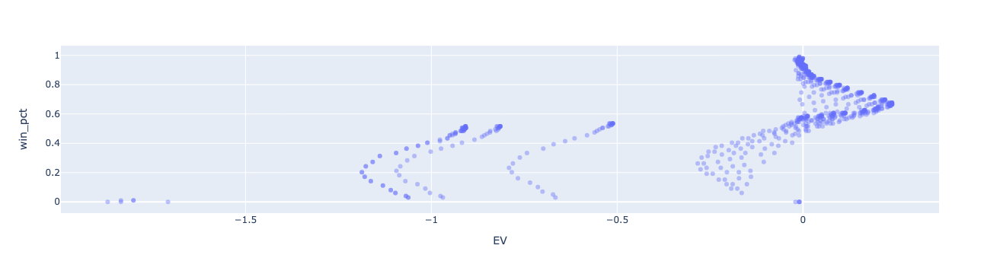

In [691]:
px.scatter(
    data_frame = menu.menu.loc['Bull put spread'].sort_values('win_pct',ascending =False).reset_index(),
    x = 'EV',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.4
)

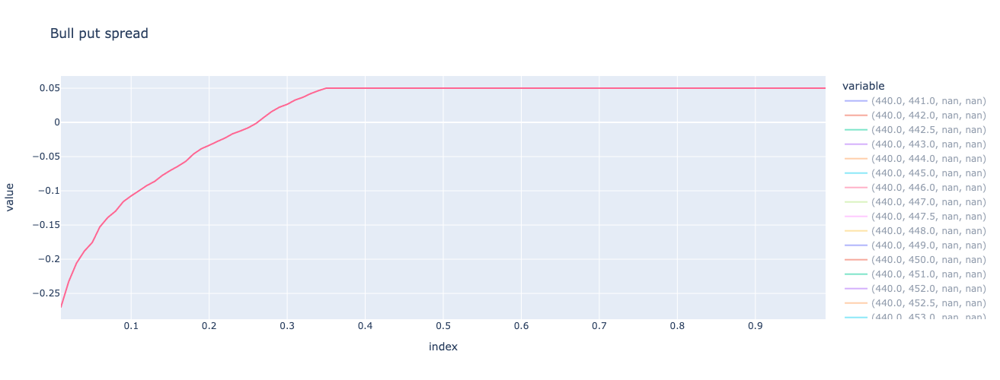

In [649]:
strategy = 'Bull put spread'
val1 = 440
val2 = 472

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,:],'quantiles'].droplevel(0,axis = 0)

df = pd.concat([i for i in menu_slice],axis=1)
df.columns = [str(i) for i in menu_slice.index.to_flat_index()]

px.line(df,height = 500,title = strategy)

In [24]:
menu.menu.loc[pd.IndexSlice['Bull put spread',456]].sort_values('win_pct',ascending = False)

/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/ipykernel_5689/861555165.py:1: PerformanceWarning:

indexing past lexsort depth may impact performance.



,,,cost,quantiles,EV,E_pct,win_pct,E_win,E_loss,kelly_criteria
leg_2,leg_3,leg_4,,,,,,,,
457.0,NaN,NaN,-0.04,0.01 -0.009600 0.02 -0.009600 0.03 -0.00...,0.015272,NaN,0.969697,0.040000,0.770930,0.385659
458.0,NaN,NaN,-0.09,0.01 -0.019100 0.02 -0.019100 0.03 -0.01...,0.034381,NaN,0.969697,0.089592,1.720930,0.387623
459.0,NaN,NaN,-0.16,0.01 -0.028400 0.02 -0.028400 0.03 -0.02...,0.062559,NaN,0.959596,0.158819,2.207979,0.397879
460.0,NaN,NaN,-0.24,0.01 -0.037600 0.02 -0.037600 0.03 -0.03...,0.090208,NaN,0.949495,0.238350,2.676823,0.382292
461.0,NaN,NaN,-0.33,0.01 -0.046700 0.02 -0.046700 0.03 -0.04...,0.112209,NaN,0.929293,0.329420,2.726536,0.344067
462.0,NaN,NaN,-0.45,0.01 -0.055500 0.02 -0.055500 0.03 -0.04...,0.143779,NaN,0.909091,0.448940,2.891859,0.323498
463.0,NaN,NaN,-0.59,0.01 -0.064100 0.02 -0.064100 0.03 -0.05...,0.176605,NaN,0.898990,0.583512,3.427211,0.305715
464.0,NaN,NaN,-0.75,0.01 -0.072500 0.02 -0.072500 0.03 -0.06...,0.205902,NaN,0.878788,0.739536,3.645793,0.281232
465.0,NaN,NaN,-0.95,0.01 -0.080500 0.02 -0.080500 0.03 -0.07...,0.248030,NaN,0.858586,0.931327,3.882846,0.269009


### Iron Condors

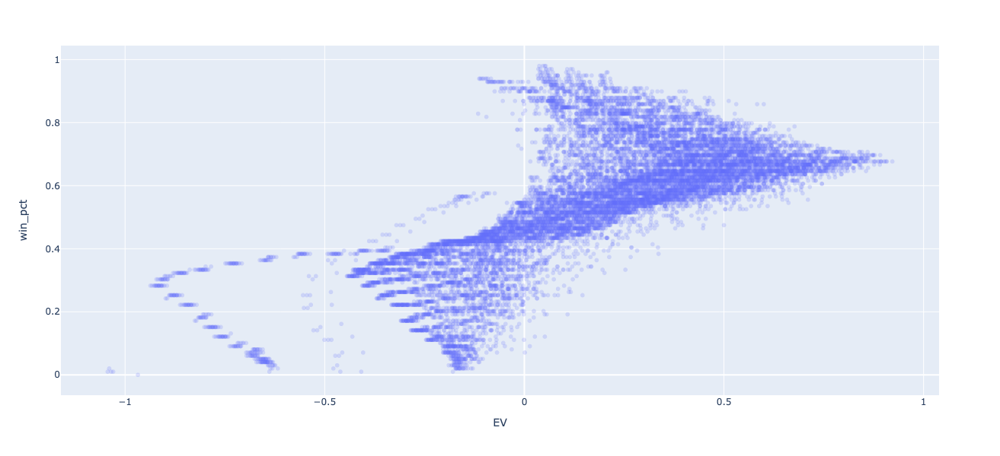

In [420]:
px.scatter(
    data_frame = menu.menu.loc['Iron condor'].sort_values('win_pct',ascending =False).reset_index(),#.sample(30000),
    x = 'EV',
    y = 'win_pct',
    hover_data = ['leg_1','leg_2','leg_3','leg_4'],
    opacity = 0.2,
    height = 600
)

In [ ]:
461

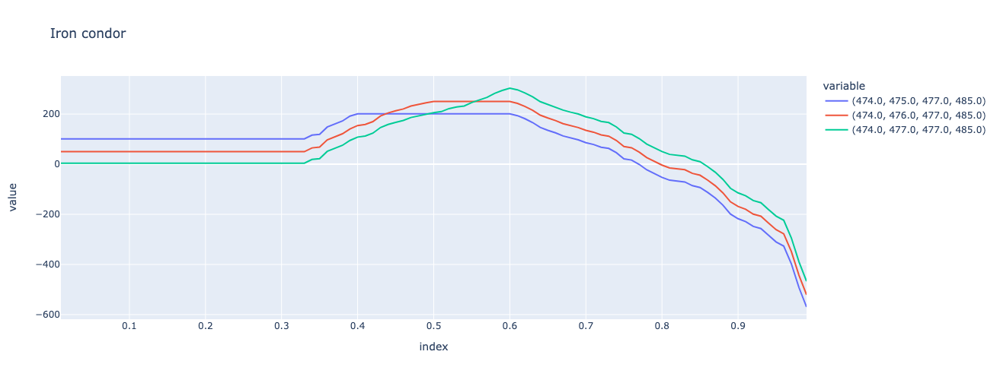

In [427]:
strategy = 'Iron condor'
val1 = 474
val2 = 477
val3 = 477
val4 = 485

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,:,val3,val4],'quantiles'].droplevel(0,axis = 0)

df = pd.concat([i for i in menu_slice],axis=1)
df.columns = [str(i) for i in menu_slice.index.to_flat_index()]

px.line(df*10000,height = 500,title = strategy)

In [428]:
menu.menu.loc[pd.IndexSlice[strategy,val1,:,val3,val4],:]

cost  \
strategy    leg_1 leg_2 leg_3 leg_4         
Iron condor 474.0 475.0 477.0 485.0 -2.01   
                  476.0 477.0 485.0 -2.50   
                  477.0 477.0 485.0 -3.04   

                                                                             quantiles  \
strategy    leg_1 leg_2 leg_3 leg_4                                                      
Iron condor 474.0 475.0 477.0 485.0  0.01    0.010100
0.02    0.010100
0.03    0.01...   
                  476.0 477.0 485.0  0.01    0.005000
0.02    0.005000
0.03    0.00...   
                  477.0 477.0 485.0  0.01    0.000400
0.02    0.000400
0.03    0.00...   

                                           EV  E_pct   win_pct     E_win  \
strategy    leg_1 leg_2 leg_3 leg_4                                        
Iron condor 474.0 475.0 477.0 485.0  0.566868    NaN  0.767677  1.329421   
                  476.0 477.0 485.0  0.614905    NaN  0.797980  1.208003   
                  477.0 477.0 485.0  0.599792    NaN  0.858586  0.999632   

                                       E_loss  kelly_criteria  
strategy    leg_1 leg_2 leg_3 leg_4                            
Iron condor 474.0 475.0 477.0 485.0  1.928225        0.430709  
                  476.0 477.0 485.0  1.697090        0.514167  
                  477.0 477.0 485.0  1.784967        0.606073

In [204]:
opt = options.OptionChain([
    options.Option.buy_put(468,1.79,data.Close[-1],floating_quintile),
    options.Option.write_put(471,2.86,data.Close[-1],floating_quintile),
    options.Option.write_call(473,2.75,data.Close[-1],floating_quintile),
    options.Option.buy_call(483,0.36,data.Close[-1],floating_quintile),
])

### Long Straddles

/var/folders/5p/b_k1m3qs09q0s_768gjrmvvh0000gp/T/ipykernel_25116/3613671719.py:3: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



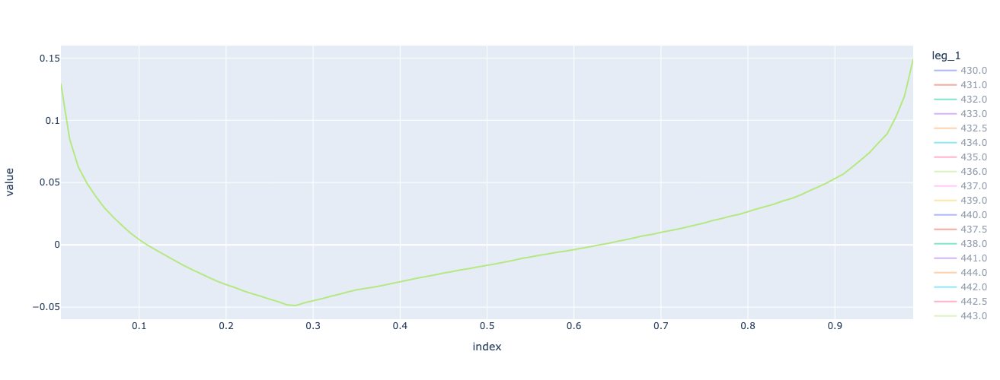

In [20]:
strategy = 'Long straddle'

df = pd.concat([i for i in menu.menu.loc[strategy].quantiles],1)
df.columns = menu.menu.loc[strategy].index.get_level_values(0)

px.line(df,height = 500)

# Maker menu

In [514]:
horizon = 22
temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)

temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,horizon+1)
],axis = 1).dropna().cumprod(1)

In [515]:
adj_factor_bounds

,max,min
adj_factor_decile,,
1,0.661213,0.330854
2,0.830924,0.661253
3,1.008487,0.830972
4,1.230522,1.008491
5,4.104313,1.230721


In [558]:
quintile = 2

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

In [517]:
temp = temp.loc[af_filter]

In [518]:
temp_qtile = pd.concat([
    temp.quantile(n/100) for n in range(5,100,5)
],axis = 1)

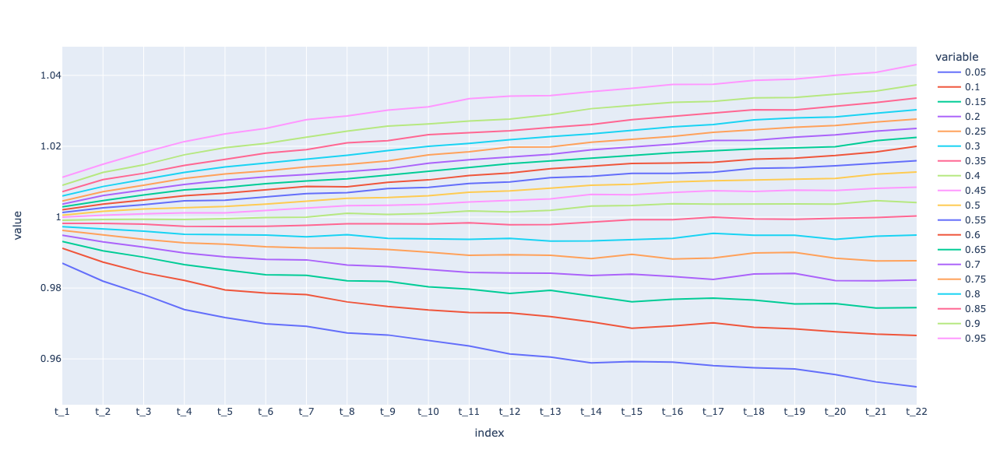

In [519]:
px.line(temp_qtile,height = 600)

In [552]:
temp.gt(1.01).cumsum(1).gt(0).mean()

t_1     0.077131
t_2     0.184032
t_3     0.269959
t_4     0.352503
t_5     0.418133
t_6     0.470230
t_7     0.523004
t_8     0.560893
t_9     0.592693
t_10    0.629905
t_11    0.656969
t_12    0.677267
t_13    0.697564
t_14    0.715832
t_15    0.729364
t_16    0.744249
t_17    0.755074
t_18    0.765900
t_19    0.774019
t_20    0.778755
t_21    0.787551
t_22    0.793640
dtype: float64

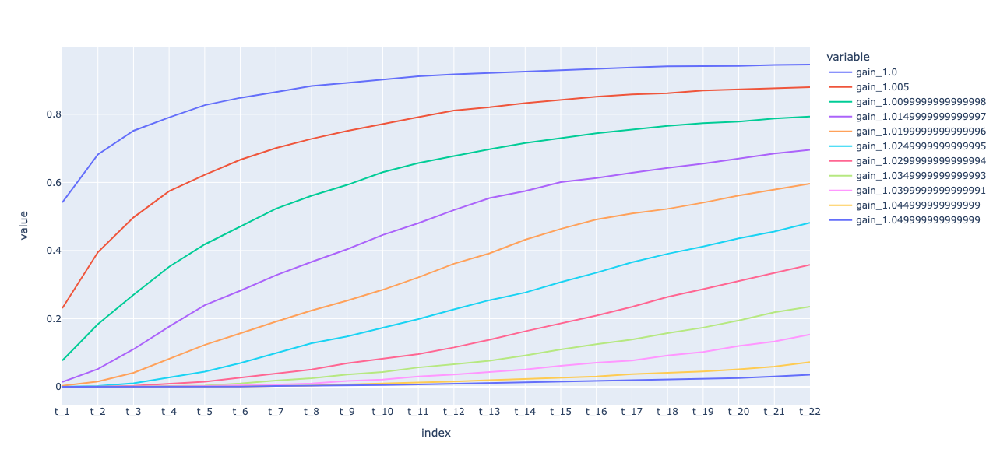

In [521]:
px.line(pd.concat([
    temp.gt(i).cumsum(1).gt(0).mean().rename(f'gain_{i}') for i in np.arange(1,1.05,0.005)
],axis = 1),height = 600)

## Black Scholes

S : current asset price

K: strike price of the option

r: risk free rate 

T : time until option expiration 

σ: annualized volatility of the asset's returns 

risk-free rate historical: https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=on&txtcolor=%23444444&ts=12&tts=12&width=1138&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=DGS1MO&scale=left&cosd=2001-07-31&coed=2023-11-30&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=2&ost=-99999&oet=99999&mma=0&fml=a&fq=Daily&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date=2023-12-02&revision_date=2023-12-02&nd=2001-07-31

In [77]:
def BlackScholes(option_type,S,K,T,r,sigma):
    N = norm.cdf
    d1 = (np.log(S/K) + (r + sigma**2/2)*T) / (sigma*np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    if option_type == 'call':
        return S * N(d1) - K * np.exp(-r*T)* N(d2)
    elif option_type == 'put':
        return K*np.exp(-r*T)*N(-d2) - S*N(-d1)
    else:
        print('Unrecognized option type')

In [613]:
BlackScholes(
    'call',
    S = data.Close[-1],
    K = 475,
    T = 20/365,
    r = 0.0554,
    sigma = 0.0974
)

3.569497552526343

In [614]:
prices_df.loc[('C',475)]

Contract Name            SPY240112C00475000
Last Trade Date       2023-12-14 4:14PM EST
Last Price                             3.84
Bid                                    3.79
Ask                                    3.83
Change                                 0.28
% Change                             +7.87%
Volume                                 4578
Open Interest                          2432
Implied Volatility                    9.74%
Name: (C, 475.0), dtype: object

In [619]:
strike = 475
price = 3.83
risk_free = 0.0554
vol = 0.0974
time = 20
targets = [round(i,2) for i in np.arange(1.2,5.2,0.2)]
quintile = 2

temp = data.Close.pct_change().add(1).to_frame().assign(t_0 = 1)
temp = pd.concat([
    temp.Close.shift(-i).rename(f't_{i}') for i in range(1,time+1)
],axis = 1).dropna().cumprod(1)

af_filter = adj_factor_hist[adj_factor_hist.quantile_backtest.between(
    adj_factor_bounds.loc[quintile,'min'],
    adj_factor_bounds.loc[quintile,'max']
)].index

temp = temp.loc[af_filter]

bs_ex = temp.copy()
bs_ex.columns = [i for i in range(time,0,-1)]
bs_ex = bs_ex.multiply(data.Close[-1])

bs_ex = bs_ex.apply(
    lambda x: BlackScholes(
        'call',
        S = x,
        K = strike,
        T = (x.name-1)/365,
        r = risk_free,
        sigma = vol
    )
).div(price)

bs_ex.columns = temp.columns

bs_ex_cum = pd.concat([
    bs_ex.gt(i).cumsum(1).gt(0).mean().rename(i) for i in targets
],axis = 1)
bs_ex_cum.columns.rename('Targets',inplace = True)

bs_ex_pv = bs_ex_cum.iloc[-1].to_frame()

bs_ex_pv = bs_ex_pv.reset_index().assign(
    target_miss_payout = [temp[bs_ex_pv.columns[0]].multiply(data.Close[-1]).add(-strike).apply(lambda x: np.maximum(x,0)).div(price)[
        ~bs_ex.gt(i).cumsum(1).gt(0)[bs_ex_pv.columns[0]]
    ].mean()-1 for i in targets],
    EV = lambda x: x[bs_ex_pv.columns[0]]*(x.Targets-1)+(1-x[bs_ex_pv.columns[0]])*x.target_miss_payout
).set_index('Targets')

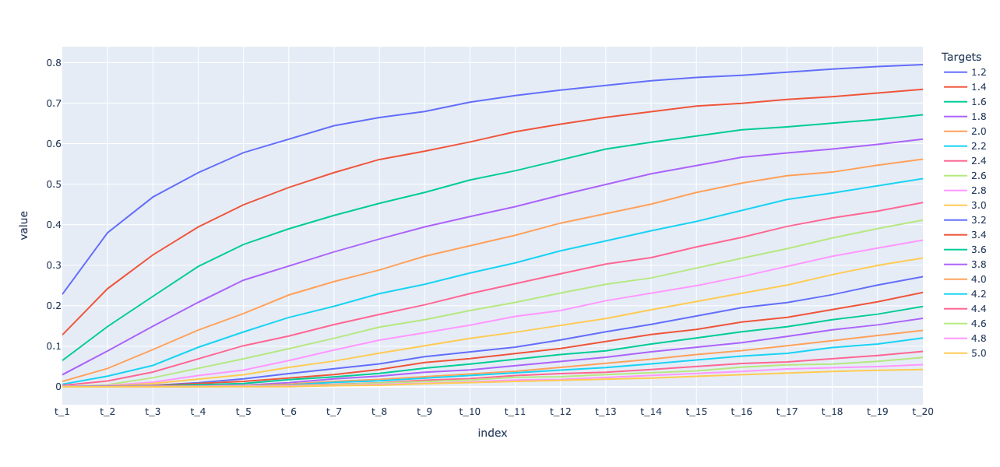

In [620]:
px.line(bs_ex_cum,height = 600)

In [623]:
bs_ex_pv

,t_20,target_miss_payout,EV
Targets,,,
1.2,0.794993,-0.929385,-0.031532
1.4,0.734100,-0.907686,0.052287
1.6,0.671177,-0.874472,0.115160
1.8,0.610961,-0.821485,0.169179
2.0,0.561570,-0.789318,0.215509
2.2,0.513532,-0.726442,0.262847
2.4,0.454668,-0.637215,0.289042
2.6,0.411367,-0.574988,0.319730
2.8,0.361976,-0.481196,0.344541


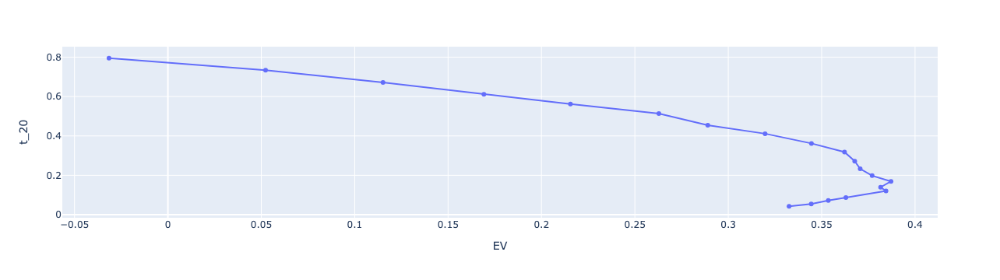

In [631]:
px.line(
    bs_ex_pv,
    y = 't_20',
    x = 'EV',
    markers = True,
    hover_name=bs_ex_pv.index
)

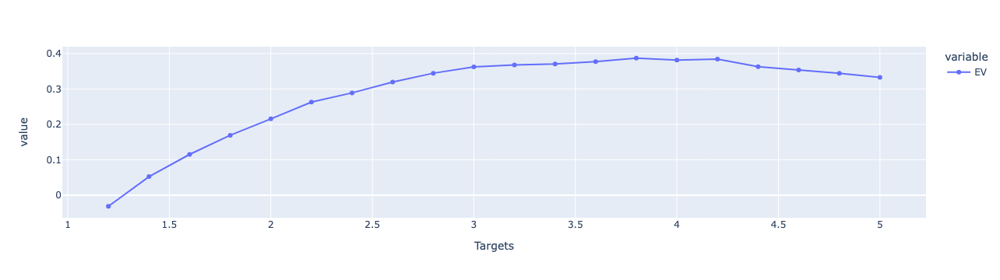

In [621]:
px.line(bs_ex_pv.EV,markers=True)

# Kelly Criterion test

In [ ]:
476.0	477.0	482.0	489.0

In [461]:
strategy = 'Iron condor'
val1 = 474
val2 = 477
val3 = 477
val4 = 485

menu_slice = menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],'quantiles']


In [462]:
menu.menu.loc[pd.IndexSlice[strategy,val1,val2,val3,val4],:]

cost                                                          -3.04
quantiles         0.01    0.000400
0.02    0.000400
0.03    0.00...
EV                                                         0.599792
E_pct                                                           NaN
win_pct                                                    0.858586
E_win                                                      0.999632
E_loss                                                     1.784967
kelly_criteria                                             0.606073
Name: (Iron condor, 474.0, 477.0, 477.0, 485.0), dtype: object

In [463]:
menu_slice.min()*100

-4.669688646866198

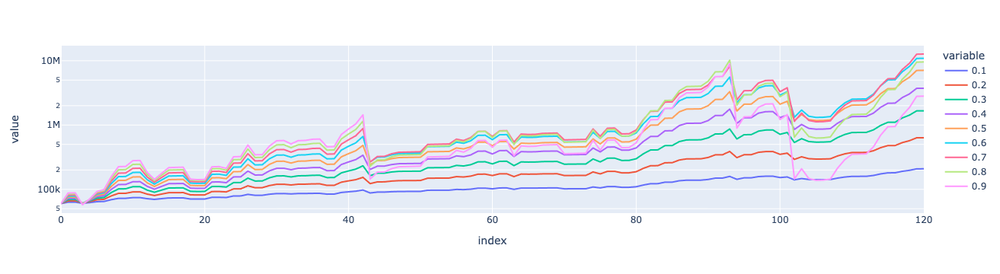

In [489]:
portfolio = 6e4
kc = 0.3
E_loss = menu_slice.min()*-100#7.295421
time = 24*5

outcome = pd.DataFrame(index = range(time+1),columns = [round(i,1) for i in np.arange(0.1,1,0.1)])
outcome.loc[:,'payouts'] = menu_slice.sample(time+1,replace = True).values
outcome.loc[0,:] = portfolio

for j in [round(i,1) for i in np.arange(0.1,1,0.1)]:
    for i in outcome.index[1:]:
        outcome.loc[i,j] = np.max([
            outcome.loc[i-1,j] 
            + round(outcome.loc[i-1,j]*j/(E_loss*100),0)
            * outcome.loc[i,'payouts']*10000,
            0
        ])
        
px.line(outcome.drop(columns = 'payouts'),log_y = True)

In [478]:
portfolio = 6e4
value_at_risk = [round(i,2) for i in np.arange(0.1,1,0.05)]
E_loss = menu_slice.min()*-100#7.295421
time = 50
iterations = 1_000

def kelly_sim(n):
    outcome = pd.DataFrame(index = range(time+1),columns = value_at_risk)
    outcome.loc[:,'payouts'] = menu_slice.sample(time+1,replace = True).values
    outcome.loc[0,:] = portfolio

    for j in value_at_risk:
        for i in outcome.index[1:]:
            if outcome.loc[i-1,j]*j/(E_loss*100) < 0:
                outcome.loc[i,j] = 0
            else:
                outcome.loc[i,j] = np.max([
                    outcome.loc[i-1,j] 
                    + round(outcome.loc[i-1,j]*j/(E_loss*100),0)
                    * outcome.loc[i,'payouts']*10000,
                    0
                ])
                
    return (n,outcome.loc[time,:].drop(columns = 'payouts'))

sims = Parallel(n_jobs=-1,verbose = 5)(delayed(kelly_sim)(i) for i in range(iterations))

kc_output = pd.DataFrame(index = range(iterations),columns = value_at_risk)
for i,j in sims:
    kc_output.loc[i,:] = j

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 468 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 966 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    7.6s finished


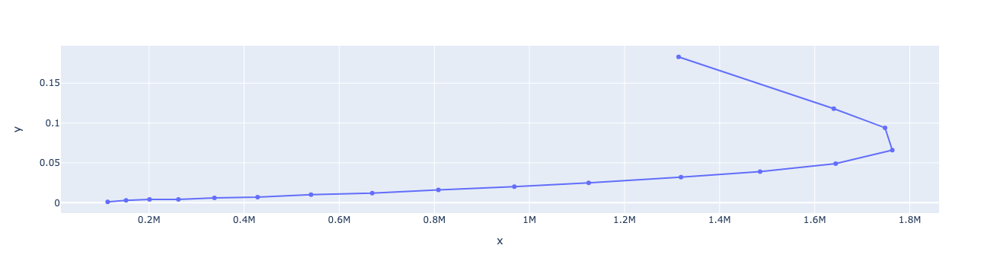

In [480]:
px.line(
    x = kc_output.median(),
    y = kc_output.lt(portfolio).mean(),
    hover_name=kc_output.columns,
    markers=True,
)

In [490]:
kc = 0.35
contracts = round(portfolio*kc/(E_loss*100))

print(f'''
Kelly criterion: {round(kc*100)}%
Contracts: {contracts}
Max loss: (${round(E_loss*100*contracts)})
Max gain: ${round(menu_slice.max()*10000*contracts)}''')


Kelly criterion: 35%
Contracts: 45
Max loss: ($21014)
Max gain: $13651


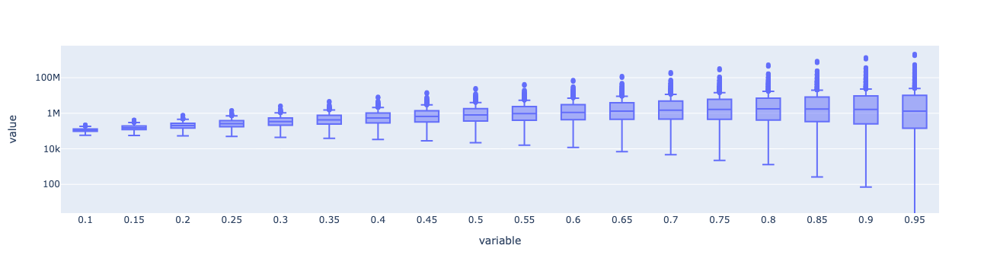

In [482]:
px.box(kc_output,log_y = True)